In [230]:
import cassandra 
print (cassandra.__version__)
import pandas as pd
pd.options.display.float_format = '{:.2f}'.format
from cassandra.cluster import Cluster
from cassandra.auth import PlainTextAuthProvider
from cassandra.concurrent import execute_concurrent_with_args
import uuid
import numpy as np

3.25.0


## Established Connection To AstraDB

In [231]:
cloud_config= {
        'secure_connect_bundle': '../secure-connect-capstone-project2.zip'
}
auth_provider = PlainTextAuthProvider('OZTxZCgzatSukjKBoWpZimZs', 'cfph4pZMPt-REY_B0BTCZ-qxZfwgpIeZA2T69DIzccYlZ2I1+8gKKk6Ruk+G+70.CyFNoZymWef1Eo1KJZk,SjYbo9SgRZwY97JfG6J8uFLvNEJ8,nCjMbcGz.wgmlJC')
cluster = Cluster(cloud=cloud_config, auth_provider=auth_provider)
#connect to keyspace_name
session = cluster.connect('iac689')


# Real work Begins

In [232]:

query = "SELECT * FROM iac689.newdata"
df = pd.DataFrame(list(session.execute(query)))
df.columns

Index(['ui', 'datel', 'distance_at_diff_altitude',
       'distance_at_diff_engine_speeds', 'distance_at_diff_roadinclination',
       'distance_at_wheelbased_vehicle_speed', 'time_at_diff_altitude',
       'time_at_diff_engine_speeds', 'time_at_diff_roadinclination',
       'time_at_wheelbased_vehicle_speed', 'truck_id'],
      dtype='object')

In [233]:
# df = df.drop(columns=['ui'])
# df

In [234]:
sec_col = df.pop('truck_id')
df.insert(1,'truck_id', sec_col)
df['datel'] = pd.to_datetime(df['datel'].astype(str))
df

,ui,truck_id,datel,distance_at_diff_altitude,distance_at_diff_engine_speeds,distance_at_diff_roadinclination,distance_at_wheelbased_vehicle_speed,time_at_diff_altitude,time_at_diff_engine_speeds,time_at_diff_roadinclination,time_at_wheelbased_vehicle_speed
0,ac880a14-d4e9-4fb5-a3b3-f72739bcf153,207,2021-06-08,0.00,4008618.00,9955.16,504250.28,0.00,0.05,0.08,5.99
1,fc172730-c91b-4887-981a-c4fc812fe1dd,208,2021-12-06,nan,11203900.00,13637.11,1121656.50,nan,0.12,0.14,11.06
2,4b1cdcb4-b9b8-42a1-b182-f9be02e17f57,238,2021-05-14,0.00,1152.34,-9.09,118.63,0.00,0.00,0.02,0.28
3,31cb0af0-1430-4882-b4dc-6bef7bc26629,284,2021-03-19,641183.50,1506367.25,278.76,49891.46,0.86,0.04,0.00,2.25
4,aa781478-1a11-4854-a6b3-2df6c53d02e4,204,2021-11-22,3800395.00,5109953.00,1609.42,263416.75,2.94,0.14,0.02,5.71
...,...,...,...,...,...,...,...,...,...,...,...
4542,5ce0ff47-1b08-4fb4-bb6c-c8124d361e7b,243,2021-11-20,804438.75,11052027.00,10190.53,1272372.38,1.57,0.12,0.11,13.23
4543,af0eb24e-122d-46e1-a36e-f533d6bb3880,206,2021-05-04,639549.62,7280906.00,6794.92,944977.19,2.08,0.08,0.06,9.87
4544,cc5c724b-ebc1-41eb-9637-667f0bf0fc14,243,2021-02-11,285624.00,6544179.00,4384.73,777250.44,0.51,0.08,0.06,8.40
4545,4b2848bc-5b59-4603-8d39-4d651b19ca04,291,2021-03-23,282749.19,10333.33,-11.29,735.71,0.28,0.01,0.00,0.61


In [235]:
df.isna().sum()

ui                                         0
truck_id                                   0
datel                                      0
distance_at_diff_altitude               1004
distance_at_diff_engine_speeds             1
distance_at_diff_roadinclination         850
distance_at_wheelbased_vehicle_speed       0
time_at_diff_altitude                   1004
time_at_diff_engine_speeds                 1
time_at_diff_roadinclination             850
time_at_wheelbased_vehicle_speed           0
dtype: int64

In [236]:
df.describe()

,truck_id,distance_at_diff_altitude,distance_at_diff_engine_speeds,distance_at_diff_roadinclination,distance_at_wheelbased_vehicle_speed,time_at_diff_altitude,time_at_diff_engine_speeds,time_at_diff_roadinclination,time_at_wheelbased_vehicle_speed
count,4547.00,3543.00,4546.00,3697.00,4547.00,3543.00,4546.00,3697.00,4547.00
mean,258.19,664472.84,65139084.63,90427.87,2579334.61,1.13,0.06,0.05,5.59
std,35.04,994815.62,1841608904.54,13623545.02,50345794.25,1.35,0.06,0.05,5.32
min,201.00,0.00,0.00,-363568064.00,0.00,0.00,0.00,0.00,0.00
25%,221.00,108.10,729041.20,629.72,43504.19,0.02,0.02,0.01,1.32
50%,274.00,279362.16,2917698.50,2912.24,253113.39,0.61,0.05,0.03,3.95
75%,290.00,924359.50,6762394.00,6342.09,631757.78,1.92,0.10,0.07,8.75
max,297.00,16746700.00,75801788416.00,346205856.00,2286124032.00,13.54,1.00,0.61,91.14


## Pre-ML Visualization

In [237]:
import matplotlib.pyplot as plt
import seaborn as sns
import altair as alt

In [320]:
def gen_bar_plot(x:str, y:str):
    plt.figure(figsize=(10,5))
    sns.barplot(x=x, y=y, data=df, ci=None)
    plt.title('{} vs. {}'.format(x,y))
    plt.xticks(rotation=45)
    return plt.show()


def gen_line_plot(y:str, df):
    truck_list = list(df['truck_id'].unique())
    input_dropdown = alt.binding_select(options = truck_list)
    selection = alt.selection_single(fields=['truck_id'], bind=input_dropdown, name='Truck_Id')
    alt_plot = alt.Chart(df).mark_line().encode(
    x='datel',
    y=y,
    tooltip=y).add_selection(selection).transform_filter(selection).properties(width=750, height=350)
    return alt_plot.display()

In [328]:
df_plot = df.drop(columns=['ui'])
df_plot['distance_at_diff_engine_speeds']= abs((df_plot['distance_at_diff_engine_speeds']-df_plot['distance_at_diff_engine_speeds'].min())/(df_plot['distance_at_diff_engine_speeds'].max()-df_plot['distance_at_diff_engine_speeds'].min()))
df_plot['distance_at_diff_altitude']= abs((df_plot['distance_at_diff_altitude']-df_plot['distance_at_diff_altitude'].min())/(df_plot['distance_at_diff_altitude'].max()-df_plot['distance_at_diff_altitude'].min()))
df_plot['distance_at_diff_roadinclination']= abs((df_plot['distance_at_diff_roadinclination']-df_plot['distance_at_diff_roadinclination'].min())/(df_plot['distance_at_diff_roadinclination'].max()-df_plot['distance_at_diff_roadinclination'].min()))
df_plot['distance_at_wheelbased_vehicle_speed']= abs((df_plot['distance_at_wheelbased_vehicle_speed']-df_plot['distance_at_wheelbased_vehicle_speed'].min())/(df_plot['distance_at_wheelbased_vehicle_speed'].max()-df_plot['distance_at_wheelbased_vehicle_speed'].min()))


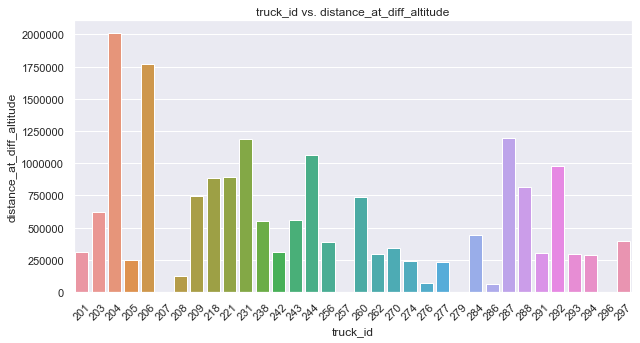

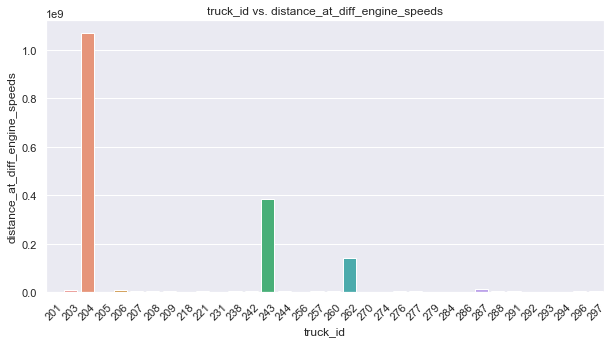

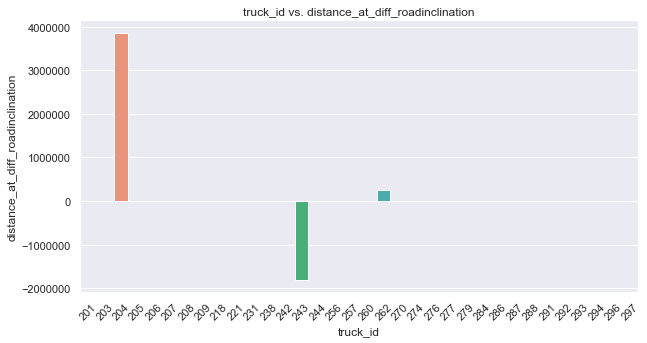

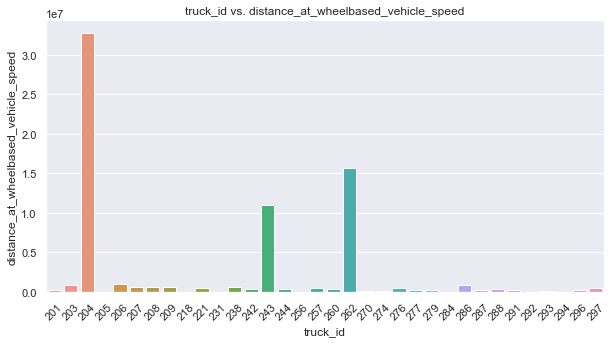

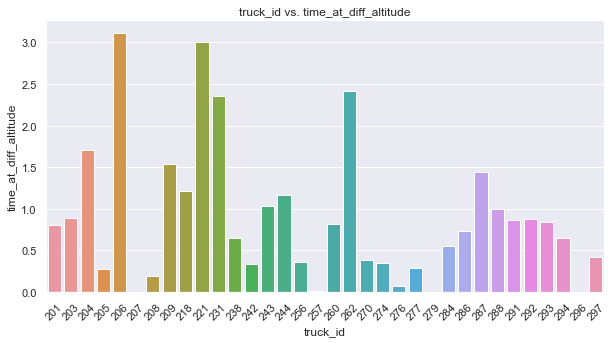

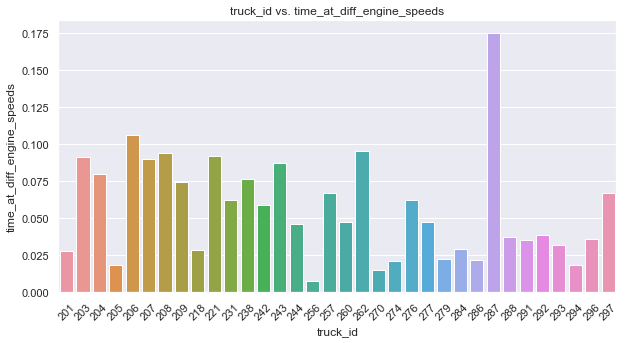

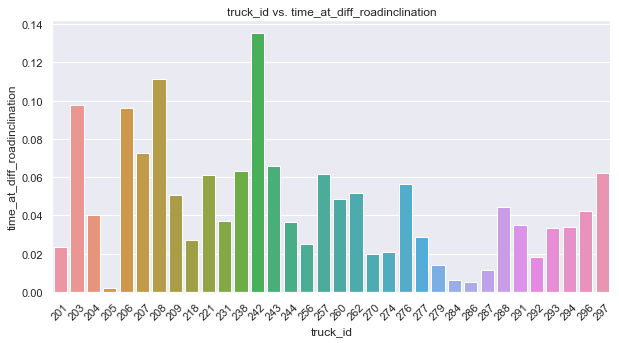

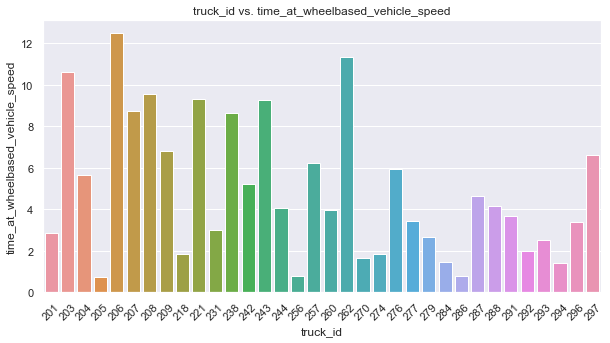

In [330]:
for i in df_plot.columns:
    if (str(i) != 'datel' and str(i) != 'truck_id' and str(i) != 'ui'):
        gen_bar_plot('truck_id', i)

In [331]:
#truck 204, truck 284, truck 296, truck 242, truck 293
gen_line_plot('distance_at_diff_engine_speeds', df_plot)

alt.Chart(...)

In [333]:
#truck 204, truck 284, truck 296, truck 242, truck 293
gen_line_plot('time_at_diff_roadinclination', df_plot)

alt.Chart(...)

In [334]:
for i in df_plot.columns:
    if (str(i) != 'datel' and str(i) != 'truck_id' and str(i) != 'ui'):
        chart = alt.Chart(df_plot).mark_line().encode(
        x='datel',
        y=i,
        color = alt.Color('truck_id', legend=None),
        strokeDash='truck_id'
        ).properties(width=750, height=350)
        chart.display()

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

# Kmeans

In [245]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler

In [246]:
df = df.dropna()
df_info = df.iloc[:,:3]
df_info

,ui,truck_id,datel
0,ac880a14-d4e9-4fb5-a3b3-f72739bcf153,207,2021-06-08
2,4b1cdcb4-b9b8-42a1-b182-f9be02e17f57,238,2021-05-14
3,31cb0af0-1430-4882-b4dc-6bef7bc26629,284,2021-03-19
4,aa781478-1a11-4854-a6b3-2df6c53d02e4,204,2021-11-22
6,a74f2e8a-610e-46a5-b2d3-5d85027bf32c,296,2021-04-15
...,...,...,...
4542,5ce0ff47-1b08-4fb4-bb6c-c8124d361e7b,243,2021-11-20
4543,af0eb24e-122d-46e1-a36e-f533d6bb3880,206,2021-05-04
4544,cc5c724b-ebc1-41eb-9637-667f0bf0fc14,243,2021-02-11
4545,4b2848bc-5b59-4603-8d39-4d651b19ca04,291,2021-03-23


In [247]:
df_kmeans = df.iloc[:,3:]
df_kmeans

,distance_at_diff_altitude,distance_at_diff_engine_speeds,distance_at_diff_roadinclination,distance_at_wheelbased_vehicle_speed,time_at_diff_altitude,time_at_diff_engine_speeds,time_at_diff_roadinclination,time_at_wheelbased_vehicle_speed
0,0.00,4008618.00,9955.16,504250.28,0.00,0.05,0.08,5.99
2,0.00,1152.34,-9.09,118.63,0.00,0.00,0.02,0.28
3,641183.50,1506367.25,278.76,49891.46,0.86,0.04,0.00,2.25
4,3800395.00,5109953.00,1609.42,263416.75,2.94,0.14,0.02,5.71
6,0.00,4468969.00,6310.83,457647.44,0.00,0.05,0.07,4.96
...,...,...,...,...,...,...,...,...
4542,804438.75,11052027.00,10190.53,1272372.38,1.57,0.12,0.11,13.23
4543,639549.62,7280906.00,6794.92,944977.19,2.08,0.08,0.06,9.87
4544,285624.00,6544179.00,4384.73,777250.44,0.51,0.08,0.06,8.40
4545,282749.19,10333.33,-11.29,735.71,0.28,0.01,0.00,0.61


In [248]:
df_cols = df_kmeans.columns.tolist()
df_cols

['distance_at_diff_altitude',
 'distance_at_diff_engine_speeds',
 'distance_at_diff_roadinclination',
 'distance_at_wheelbased_vehicle_speed',
 'time_at_diff_altitude',
 'time_at_diff_engine_speeds',
 'time_at_diff_roadinclination',
 'time_at_wheelbased_vehicle_speed']

In [249]:
scaler =  MinMaxScaler().fit(df_kmeans)
df_kmeans_scale = scaler.transform(df_kmeans)
df_kmeans_scale

array([[0.00000000e+00, 5.28828948e-05, 5.12244827e-01, ...,
        1.80194717e-01, 1.36934850e-01, 2.64758712e-01],
       [0.00000000e+00, 1.52020655e-08, 5.12230789e-01, ...,
        9.97547531e-03, 3.37096387e-02, 1.23060302e-02],
       [1.08683523e-01, 1.98724500e-05, 5.12231194e-01, ...,
        1.36139682e-01, 1.67347424e-03, 9.94002975e-02],
       ...,
       [4.84145688e-02, 8.63327784e-05, 5.12236979e-01, ...,
        2.72182069e-01, 1.00766042e-01, 3.71060374e-01],
       [4.79272750e-02, 1.36320438e-07, 5.12230786e-01, ...,
        2.21453249e-02, 7.75350551e-04, 2.67556053e-02],
       [1.79592750e-02, 4.94364985e-05, 5.12233892e-01, ...,
        1.52918492e-01, 2.83482758e-02, 2.28708179e-01]])

In [250]:
dist_df = []
dist_df_scale = []
for n_clusters in range(1,15):
    
    km = KMeans(n_clusters = n_clusters, max_iter=150, random_state=123)
    
    km.fit(df_kmeans)
    
    dist_df.append([n_clusters, km.inertia_])
    
    km2 = KMeans(n_clusters = n_clusters, max_iter=150, random_state=123)
    
    km2.fit(df_kmeans_scale)
    
    dist_df_scale.append([n_clusters, km2.inertia_])
    
dist_df = pd.DataFrame(dist_df, columns=['n_clusters', 'distance from centroid'])
dist_df_scale = pd.DataFrame(dist_df_scale, columns=['n_clusters', 'distance from centroid'])

Text(0.5, 1.0, 'K-Means Elbow')

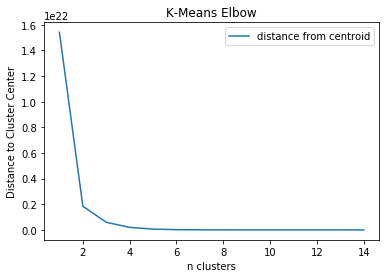

In [251]:
dist_df.set_index('n_clusters').plot()
plt.xlabel('n clusters')
plt.ylabel('Distance to Cluster Center')
plt.title('K-Means Elbow')

Text(0.5, 1.0, 'K-Means Elbow')

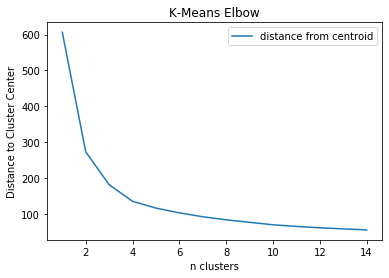

In [252]:
dist_df_scale.set_index('n_clusters').plot()
plt.xlabel('n clusters')
plt.ylabel('Distance to Cluster Center')
plt.title('K-Means Elbow')

In [253]:
km = KMeans(n_clusters = 4, max_iter=150, random_state=123)
km.fit(df_kmeans_scale)
labels = km.labels_
labels

array([1, 1, 1, ..., 2, 1, 1], dtype=int32)

In [254]:
df_scale = pd.DataFrame(df_kmeans_scale, columns=df_cols)
df_scale['cluster'] = labels
df_scale

,distance_at_diff_altitude,distance_at_diff_engine_speeds,distance_at_diff_roadinclination,distance_at_wheelbased_vehicle_speed,time_at_diff_altitude,time_at_diff_engine_speeds,time_at_diff_roadinclination,time_at_wheelbased_vehicle_speed,cluster
0,0.00,0.00,0.51,0.00,0.00,0.18,0.14,0.26,1
1,0.00,0.00,0.51,0.00,0.00,0.01,0.03,0.01,1
2,0.11,0.00,0.51,0.00,0.21,0.14,0.00,0.10,1
3,0.64,0.00,0.51,0.00,0.74,0.48,0.03,0.25,3
4,0.00,0.00,0.51,0.00,0.00,0.18,0.11,0.22,1
...,...,...,...,...,...,...,...,...,...
2834,0.14,0.00,0.51,0.00,0.39,0.43,0.18,0.58,0
2835,0.11,0.00,0.51,0.00,0.52,0.29,0.09,0.44,0
2836,0.05,0.00,0.51,0.00,0.13,0.27,0.10,0.37,2
2837,0.05,0.00,0.51,0.00,0.07,0.02,0.00,0.03,1


In [255]:
df_scale.insert(0, 'uid', df_info['ui'].values)
df_scale.insert(1, 'date', df_info['datel'].values)
df_scale.insert(2,'truck_id',df_info['truck_id'].values)
df_scale

,uid,date,truck_id,distance_at_diff_altitude,distance_at_diff_engine_speeds,distance_at_diff_roadinclination,distance_at_wheelbased_vehicle_speed,time_at_diff_altitude,time_at_diff_engine_speeds,time_at_diff_roadinclination,time_at_wheelbased_vehicle_speed,cluster
0,ac880a14-d4e9-4fb5-a3b3-f72739bcf153,2021-06-08,207,0.00,0.00,0.51,0.00,0.00,0.18,0.14,0.26,1
1,4b1cdcb4-b9b8-42a1-b182-f9be02e17f57,2021-05-14,238,0.00,0.00,0.51,0.00,0.00,0.01,0.03,0.01,1
2,31cb0af0-1430-4882-b4dc-6bef7bc26629,2021-03-19,284,0.11,0.00,0.51,0.00,0.21,0.14,0.00,0.10,1
3,aa781478-1a11-4854-a6b3-2df6c53d02e4,2021-11-22,204,0.64,0.00,0.51,0.00,0.74,0.48,0.03,0.25,3
4,a74f2e8a-610e-46a5-b2d3-5d85027bf32c,2021-04-15,296,0.00,0.00,0.51,0.00,0.00,0.18,0.11,0.22,1
...,...,...,...,...,...,...,...,...,...,...,...,...
2834,5ce0ff47-1b08-4fb4-bb6c-c8124d361e7b,2021-11-20,243,0.14,0.00,0.51,0.00,0.39,0.43,0.18,0.58,0
2835,af0eb24e-122d-46e1-a36e-f533d6bb3880,2021-05-04,206,0.11,0.00,0.51,0.00,0.52,0.29,0.09,0.44,0
2836,cc5c724b-ebc1-41eb-9637-667f0bf0fc14,2021-02-11,243,0.05,0.00,0.51,0.00,0.13,0.27,0.10,0.37,2
2837,4b2848bc-5b59-4603-8d39-4d651b19ca04,2021-03-23,291,0.05,0.00,0.51,0.00,0.07,0.02,0.00,0.03,1


In [276]:
df_scale.date

0      2021-06-08
1      2021-05-14
2      2021-03-19
3      2021-11-22
4      2021-04-15
          ...    
2834   2021-11-20
2835   2021-05-04
2836   2021-02-11
2837   2021-03-23
2838   2021-06-05
Name: date, Length: 2839, dtype: datetime64[ns]

In [277]:
df_scale[(df_scale.date>'2021-07-01') & (df_scale.date<'2021-09-01')]

,uid,date,truck_id,distance_at_diff_altitude,distance_at_diff_engine_speeds,distance_at_diff_roadinclination,distance_at_wheelbased_vehicle_speed,time_at_diff_altitude,time_at_diff_engine_speeds,time_at_diff_roadinclination,time_at_wheelbased_vehicle_speed,cluster
6,acf291b7-92ec-4529-88c4-fa849ca9a546,2021-08-08,291,0.00,0.00,0.51,0.00,0.06,0.02,0.02,0.03,1
15,4fdd1745-4ab1-4215-8db5-f2cabe6cd585,2021-07-24,270,0.08,0.00,0.51,0.00,0.11,0.06,0.03,0.09,1
37,34ce3e7a-ff8d-4ad8-9c06-315f9115ec5b,2021-07-28,203,0.09,0.00,0.51,0.00,0.12,0.50,0.23,0.77,2
42,0db081ed-c0c2-4770-8e91-a815567cca7b,2021-07-11,203,0.03,0.00,0.51,0.00,0.02,0.61,0.25,1.00,2
44,1d0984ee-df7b-4bb3-b2b3-a7e935a2be7a,2021-07-21,291,0.00,0.00,0.51,0.00,0.28,0.15,0.06,0.21,1
...,...,...,...,...,...,...,...,...,...,...,...,...
2810,05ebf78b-8df3-4420-9e8f-dea16e49bdbd,2021-07-08,243,0.00,0.00,0.51,0.00,0.00,0.00,0.00,0.00,1
2811,68b9765d-d4b8-45e7-99dc-048b9fb8f036,2021-07-21,270,0.10,0.00,0.51,0.00,0.18,0.10,0.07,0.15,1
2814,2123b731-02ac-41a9-80fa-bb8e5e48e32a,2021-07-08,206,0.22,0.00,0.51,0.00,0.60,0.30,0.10,0.47,0
2824,bb05315e-19b1-458c-8360-0e24ca0c59af,2021-07-05,203,0.06,0.00,0.51,0.00,0.11,0.25,0.04,0.34,1


# Kmeans Plot

In [310]:
def genbar_plot_cluster(y:str, df):
    sns.barplot(data = df, x='cluster',y=y, ci=None)
    plt.title('cluster vs {}'.format(y))
    return plt.show()

def genbar_line_cluster(y:str, df, s_date:str, e_date:str):
    df = df[(df.date>s_date) & (df.date<e_date)]
    sns.set(rc = {'figure.figsize':(12,7)})
    sns.lineplot(data = df, x='date',y=y, hue='cluster', ci=None)
    plt.title('cluster vs {}'.format(y))
    plt.xticks(rotation=90)
    return plt.show()

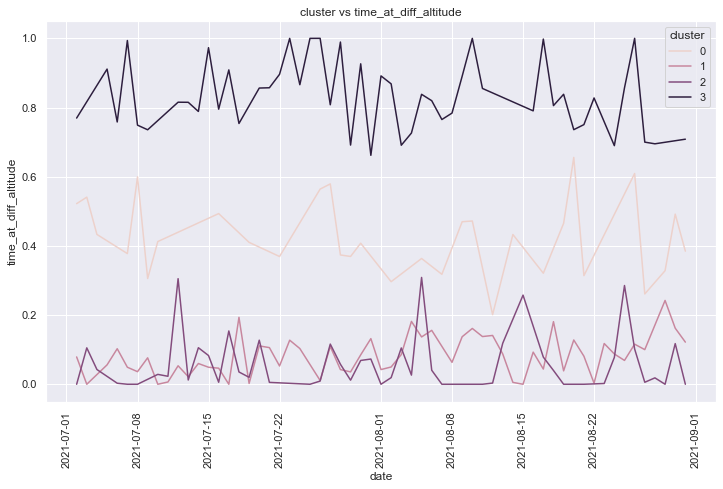

In [311]:
genbar_line_cluster('time_at_diff_altitude', df_scale, '2021-07-01','2021-09-01' )

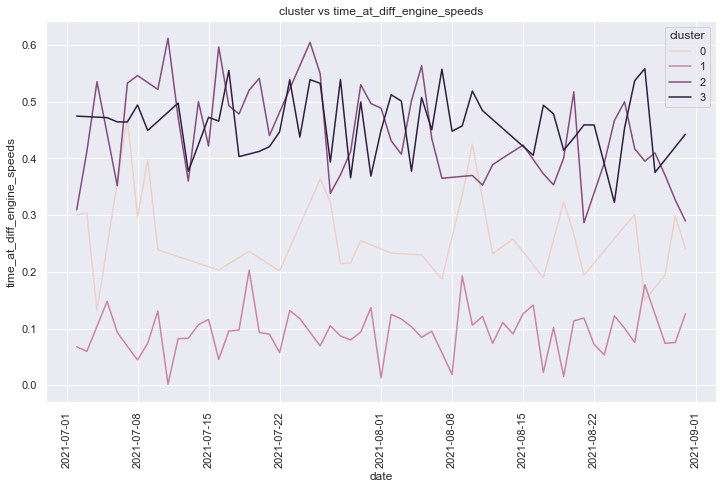

In [312]:
genbar_line_cluster('time_at_diff_engine_speeds', df_scale, '2021-07-01','2021-09-01' )

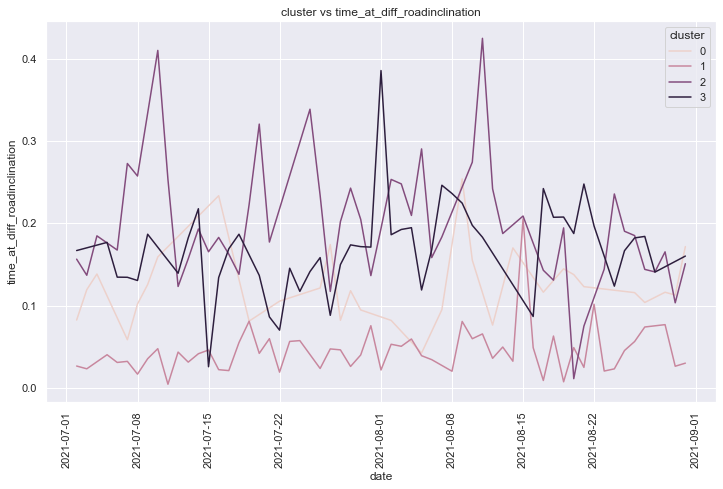

In [313]:
genbar_line_cluster('time_at_diff_roadinclination', df_scale, '2021-07-01','2021-09-01' )

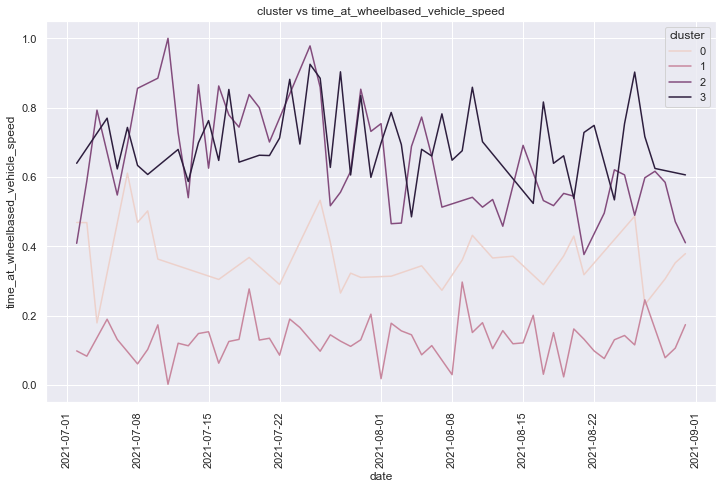

In [314]:
genbar_line_cluster('time_at_wheelbased_vehicle_speed', df_scale, '2021-07-01','2021-09-01' )

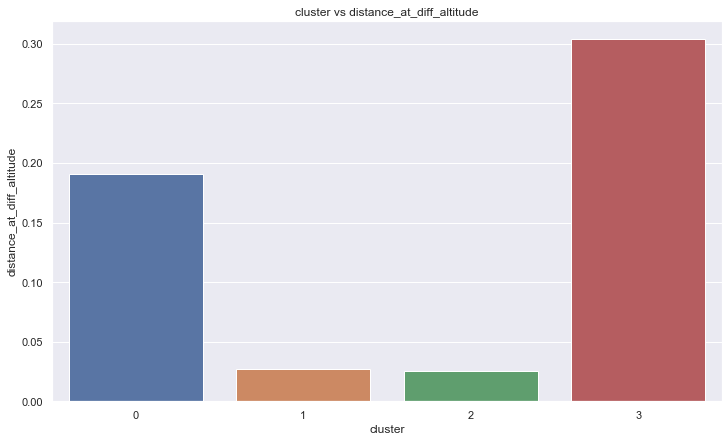

In [304]:
genbar_plot_cluster('distance_at_diff_altitude', df_scale)

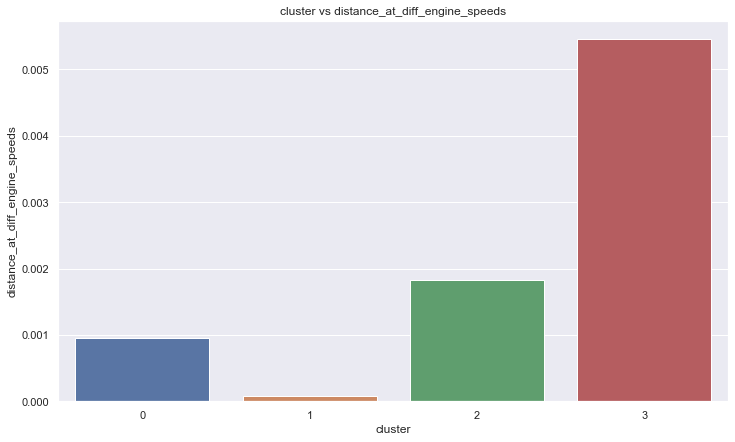

In [305]:
genbar_plot_cluster('distance_at_diff_engine_speeds', df_scale)

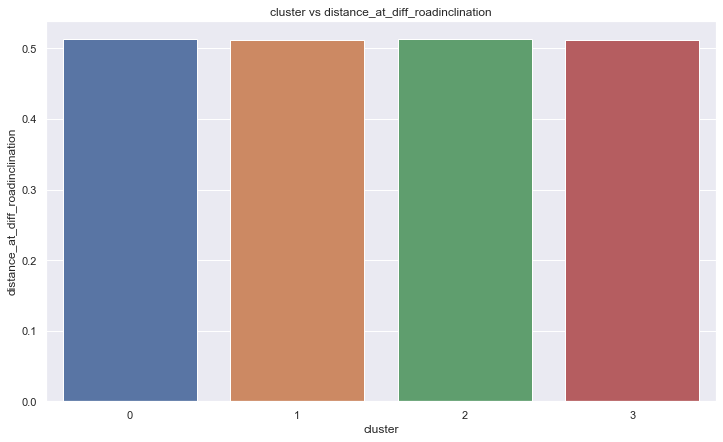

In [306]:
genbar_plot_cluster('distance_at_diff_roadinclination', df_scale)

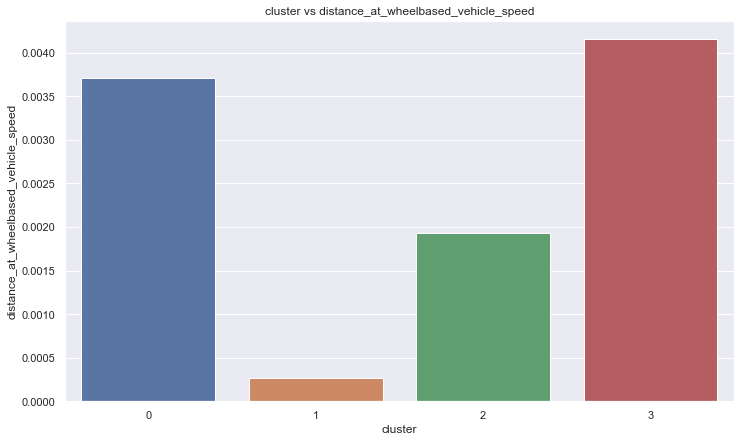

In [307]:
genbar_plot_cluster('distance_at_wheelbased_vehicle_speed', df_scale)

In [262]:
df_scale[df_scale['cluster']==0].truck_id.unique()

array([287, 204, 231, 201, 256, 292, 206, 262, 277, 218, 221, 291, 203,
       243, 260, 284, 244, 270, 293, 286, 297, 238, 288, 294, 242, 208])

In [263]:
df_scale[df_scale['cluster']==1].truck_id.unique()

array([207, 238, 284, 296, 291, 292, 208, 293, 270, 286, 201, 243, 205,
       203, 231, 204, 276, 206, 262, 288, 274, 257, 297, 287, 244, 242,
       260, 277, 294, 218, 221, 256, 209, 279])

In [264]:
df_scale[df_scale['cluster']==2].truck_id.unique()

array([243, 238, 297, 203, 207, 208, 276, 257, 242, 277, 204])

In [265]:
df_scale[df_scale['cluster']==3].truck_id.unique()

array([204, 262, 203, 243, 206, 221, 270, 238, 242, 244, 287, 209, 231,
       208, 297, 218])

# PCA for Visualization

In [266]:
from sklearn.decomposition import PCA
import plotly.express as px

In [267]:
pca = PCA(n_components=3)
x_pca = pca.fit_transform(df_kmeans_scale)

In [268]:
df_scale_pca = pd.DataFrame(x_pca, columns=['pca_1','pca_2','pca_3'])
df_scale_pca['cluster'] = labels
df_scale_pca

,pca_1,pca_2,pca_3,cluster
0,-0.23,0.16,-0.01,1
1,-0.43,-0.09,-0.01,1
2,-0.16,-0.14,0.03,1
3,0.57,-0.34,0.38,3
4,-0.26,0.13,0.00,1
...,...,...,...,...
2834,0.35,0.21,-0.01,0
2835,0.29,-0.03,-0.10,0
2836,-0.04,0.17,-0.00,2
2837,-0.36,-0.13,0.00,1


In [270]:
fig = px.scatter_3d(df_scale_pca, x='pca_1',y='pca_2',z='pca_3', color='cluster', size_max=2)
fig.show()

# Most Important Features in Determining Cluster

In [271]:
from sklearn.ensemble import RandomForestClassifier

In [272]:
x = df_scale.iloc[:,3:11]
y = df_scale.iloc[:,-1:]

# Random Forest Classifier to find the most important features

In [273]:
rnd_clf = RandomForestClassifier(n_estimators=500, n_jobs=-1, random_state=42)
rnd_clf.fit(x, y)

/Users/vathanahim/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=-1, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [274]:
# Calculate feature importances
importances = rnd_clf.feature_importances_
# Sort feature importances in descending order based on title
indices = np.argsort(importances)[::-1]

names = [x.columns[i] for i in indices]

df_f = pd.DataFrame({'features': names, 'values':importances[indices].tolist()})
df_f

,features,values
0,time_at_diff_altitude,0.30
1,time_at_diff_engine_speeds,0.21
2,time_at_wheelbased_vehicle_speed,0.15
3,distance_at_diff_altitude,0.12
4,distance_at_diff_engine_speeds,0.10
5,distance_at_wheelbased_vehicle_speed,0.07
6,time_at_diff_roadinclination,0.04
7,distance_at_diff_roadinclination,0.02


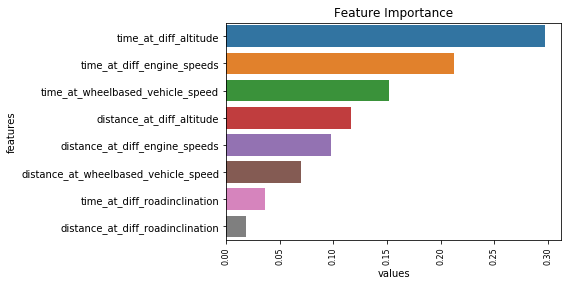

In [275]:

sns.barplot(data=df_f, x='values', y='features')
# Add feature names as x-axis labels
plt.xticks(rotation=90, fontsize = 8)
# Create plot title
plt.title("Feature Importance")
# Show plot
plt.show()